In [1]:
import matplotlib.animation
import numpy as np
import matplotlib.pyplot as plt

from jansen_linkage import jansenLinkage
from tom_utils import Point, fourBar
from tom_utils import freudenstein_method, burmester_method

plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.rcParams["figure.autolayout"] = True
plt.rcParams['figure.constrained_layout.use'] = True
plt.ioff()
%matplotlib inline

## Given

In [2]:
crank_angles = np.array([250, 0, 120, 190])*np.pi/180

ri = np.array([[-33.242608 , -79.38349971],
        [ -5.16011052, -83.95693293],
        [ 34.33157808, -80.72194859],
        [ -1.95110233, -61.725849  ]])

abs_gam6 = np.array([ 4.5174296 ,  4.37526368, -7.34914645, -7.19628072])

delta = ri[1:]-ri[0]
gam6 = abs_gam6[1:] - abs_gam6[0]

## Free Choices

In [3]:
# 4 positions of z33
len_z33 = 35
ang_z33 = np.array([158,156,199,195])*np.pi/180
pos_z33 = []
for tht in ang_z33:
    pos_z33.append([len_z33*np.cos(tht), len_z33*np.sin(tht)])

pos_z33 = np.array(pos_z33)
z33i = pos_z33[0]

# one of tht4, tht5 (dirctly calculated as intersection of m curves)

# change in angle b/w pos1 and pos2
tht7 = 23.5*np.pi/180
tht2 = 28*np.pi/180

## Dyad Synthesis

- z5, z62 are synthesized for some tht4
- (z33), z4, z63 are synthesized for some tht5
- tht4 and tht5 are adjusted such that their circle points (m point) is same

48 0 49 0 0.26325283413722544
53 0 55 0 0.2007333923113987
54 0 56 0 0.20171629835068947
54 0 56 0 0.2598136735715473
54 0 56 0 0.29770998136048094
54 0 56 0 0.27023352842240594
54 0 56 0 0.2124850073304782
54 0 56 0 0.12141116067523285
88 0 100 0 0.2529219032769584
88 0 100 0 0.12926334287411007
88 0 100 0 0.17715002568384874
88 0 100 0 0.19506852748633566
88 0 100 0 0.17618447851277713
88 0 100 0 0.2602364509860185
88 0 100 0 0.24735810356707463
88 0 100 0 0.29236406846606755
88 0 100 0 0.18109546017400477
88 1 100 1 0.17278088797359664


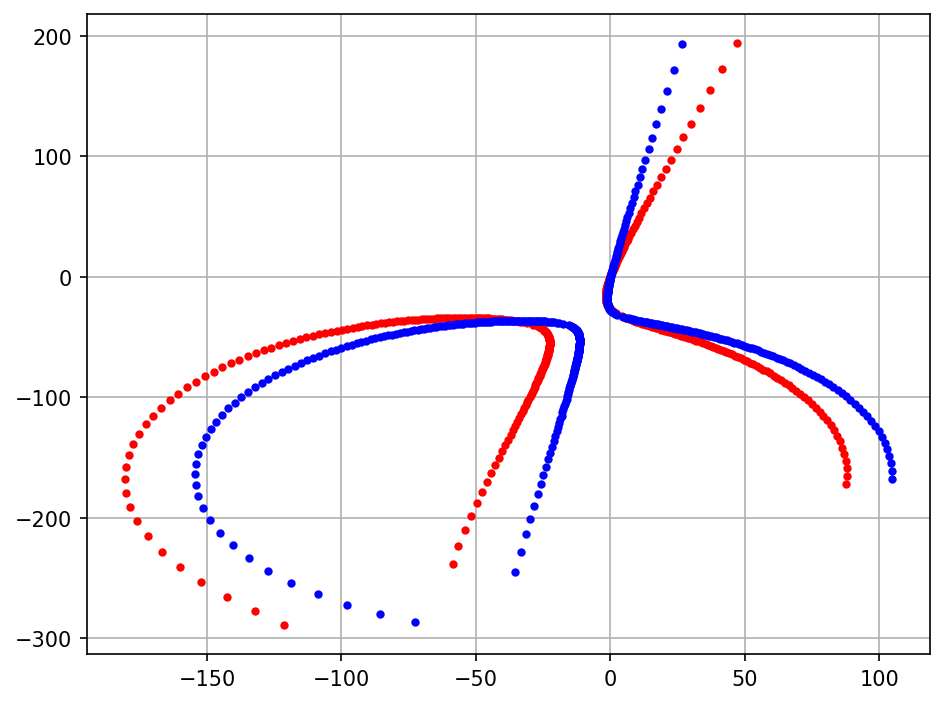

In [4]:
triad_delta = np.array([delta[0] - (pos_z33[1]-pos_z33[0]),
                        delta[1] - (pos_z33[2]-pos_z33[0]),
                        delta[2] - (pos_z33[3]-pos_z33[0])])

plt.grid("on")

m5_circ = []
m4_circ = []

for mode in range(2):
    for tht in range(10,350):
    
        z5i, z62i, gam5 = burmester_method(gam6, delta, (tht)*np.pi/180, mode=mode)
        m5 = ri[0]-z62i-z5i
        m5_circ.append([m5,tht, mode])
        
        plt.plot(m5[0], m5[1], ".r")
        

for mode in range(2):
    for tht in range(10,350):
    
        z4i, z63i, gam4 = burmester_method(gam6, triad_delta, (tht)*np.pi/180, mode=mode)
        m4 = ri[0]-z63i-z4i-pos_z33[0]
        m4_circ.append([m4,tht, mode])
        
        plt.plot(m4[0], m4[1], ".b")

dist = 1e17
tht5 = 0
tht4 = 0
mode5 = -1
mode4 = -1

for p5 in m5_circ:
    for p4 in m4_circ:

        cur_dist = np.linalg.norm(p5[0]-p4[0])

        if(cur_dist<0.3):
            print(tht5, p5[2], tht4, p4[2], cur_dist)
        
        if dist>=cur_dist:
            dist = cur_dist
            tht5 = p5[1]
            mode5 = p5[2]
            
            tht4 = p4[1]
            mode4 = p4[2]


# chosen solution from the plot (intersection of m curves)
tht5 = 54*np.pi/180
mode5 = 0

tht4 = 56*np.pi/180
mode4 = 0

z5i, z62i, gam5 = burmester_method(gam6, delta, tht5, mode=mode5)
z4i, z63i, gam4 = burmester_method(gam6, triad_delta, tht4, mode=mode4)


## Check Dyad synthesis

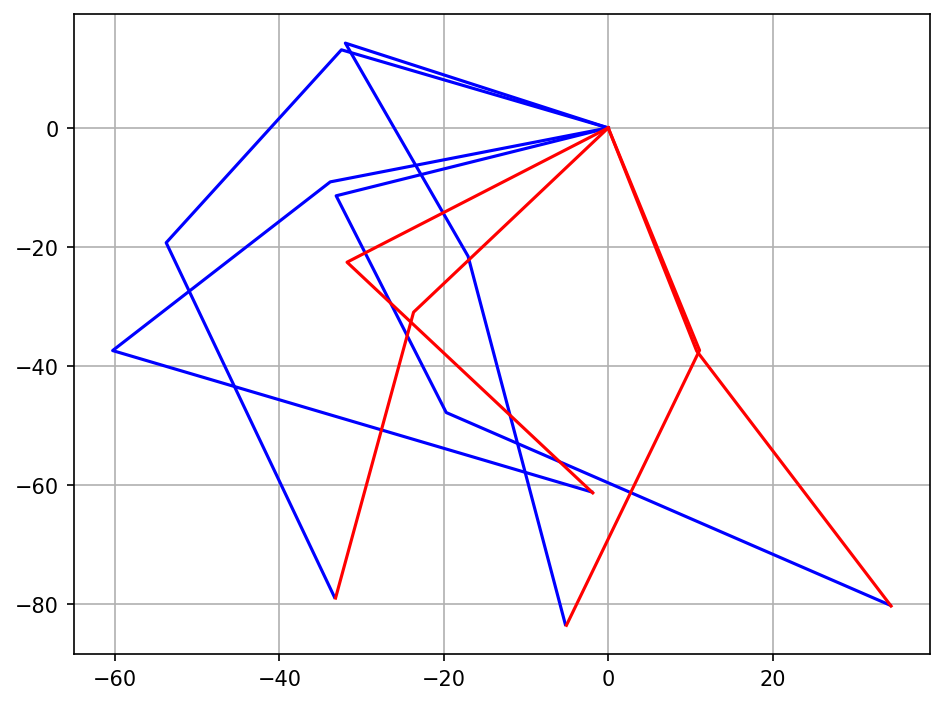

In [5]:
plt.grid("on")
for i, rii in enumerate(ri):
    z4t = z4i
    z63t = z63i

    if(i!=0):
        z4t = z4i@np.array([[np.cos(gam4[i-1]), np.sin(gam4[i-1])],
                           [-np.sin(gam4[i-1]), np.cos(gam4[i-1])]])
        
        z63t = z63i@np.array([[np.cos(gam6[i-1]), np.sin(gam6[i-1])],
                            [-np.sin(gam6[i-1]), np.cos(gam6[i-1])]])
        
    plt.plot([0,pos_z33[i,0], pos_z33[i,0]+z4t[0], pos_z33[i,0]+z4t[0]+z63t[0]], 
             [0,pos_z33[i,1], pos_z33[i,1]+z4t[1], pos_z33[i,1]+z4t[1]+z63t[1]], "b")


for i, rii in enumerate(ri):
    z5t = z5i
    z62t = z62i

    if(i!=0):
        z5t = z5i@np.array([[np.cos(gam5[i-1]), np.sin(gam5[i-1])],
                           [-np.sin(gam5[i-1]), np.cos(gam5[i-1])]])
        
        z62t = z62i@np.array([[np.cos(gam6[i-1]), np.sin(gam6[i-1])],
                            [-np.sin(gam6[i-1]), np.cos(gam6[i-1])]])
        
    plt.plot([0, z5t[0], z5t[0]+z62t[0]], 
             [0, z5t[1], z5t[1]+z62t[1]], "r")



## Two 4 Bar synthesis for prescribed timing of the linkage (4 position)

In [6]:
# First Four bar
delta5 = []
for i in range(len(gam5)):

    z5t = z5i@np.array([[np.cos(gam5[i]), np.sin(gam5[i])],
                       [-np.sin(gam5[i]), np.cos(gam5[i])]])
    delta5.append(z5t-z5i)

delta5 = np.array(delta5)
gam1 = crank_angles[1:]-crank_angles[0]

neg_z7i, z1i, gam7 = burmester_method(gam1, delta5, tht7, mode=1, debug=True)
z7i = -neg_z7i

# Second Four bar
delta1 = []
for i in range(len(gam1)):
    z1t = z1i@np.array([[np.cos(gam1[i]), np.sin(gam1[i])],
                       [-np.sin(gam1[i]), np.cos(gam1[i])]])
    delta1.append(z1t-z1i)

delta1 = np.array(delta1)
gam3 = ang_z33[1:]-ang_z33[0]

z2i, z31i, gam2 = burmester_method(gam3, delta1, tht2, mode=0, debug=True)

## Check Entire linkage assembly

In [7]:
z2i
z31i
z32i = z33i-z31i
z33i
z4i
z5i
z61i = z62i-z63i
z7i
z0i = z5i+z7i-z1i

z1, z2, z31, z32, z33, z4, z5, z61, z62, z63, z7, z0 = [np.linalg.norm(nm) for nm in [z1i, z2i, z31i, 
                                                                                      z32i, z33i, z4i, 
                                                                                     z5i, z61i, z62i,
                                                                                     z63i, z7i, z0i]]

links=  {'b': z31,
         'c': z5,
         'd': z33,
         'e': z32,
         'f': z4,
         'g': z61,
         'h': z63,
         'i': z62,
         'j': z2,
         'k': z7,
         'n': z0,
         'm': z1}
tn = np.arctan2(z0i[1], z0i[0])

print(links)

{'b': 42.04979536525544, 'c': 38.955334993184906, 'd': 35.0, 'e': 52.99502224451284, 'f': 38.768456641214904, 'g': 32.09674130443363, 'h': 62.925484887952884, 'i': 48.92024552610486, 'j': 50.063259029126854, 'k': 61.01699237309537, 'n': 38.66944450634414, 'm': 15.29921620319755}


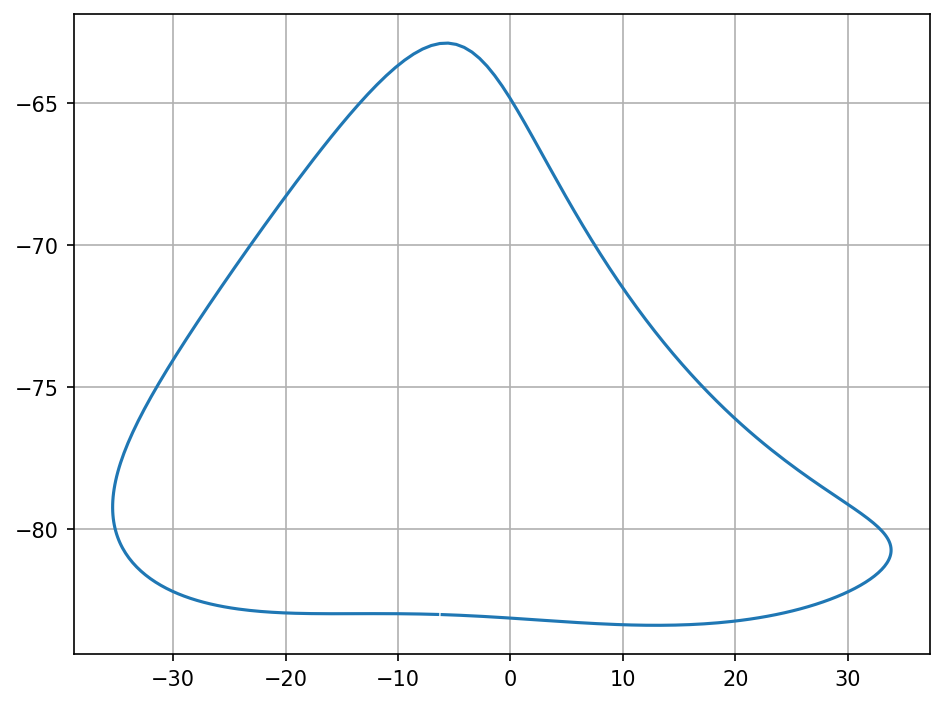

In [8]:
# coupler curve
jl = jansenLinkage(links=links, tn=tn)
p7 = []
plt.grid("on")
for i in range(360):
    pos, _, _ , _ = jl.kinematic_analysis(tm=i*np.pi/180)
    p7.append([pos["px"], pos["py"]])

p7 = np.array(p7)
plt.plot(p7[:, 0], p7[:, 1])

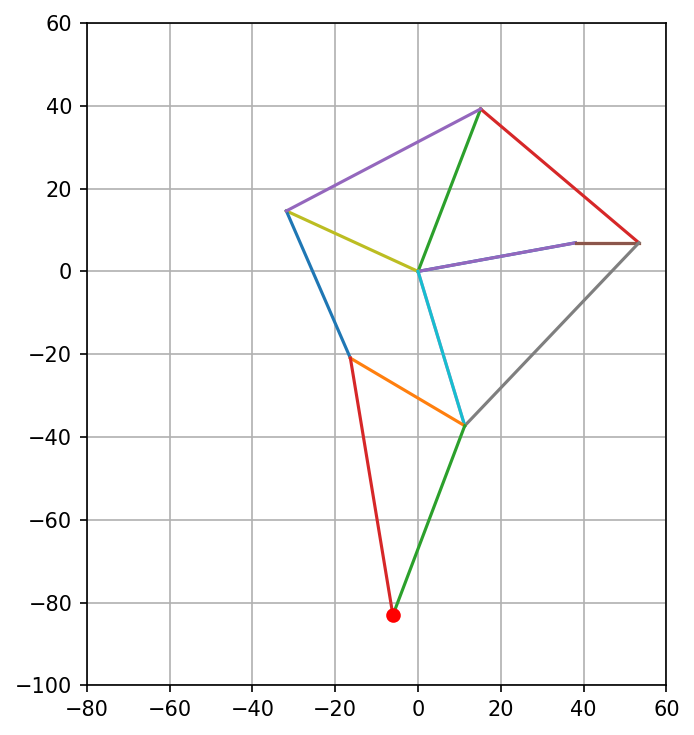

In [9]:
# Animation
jl = jansenLinkage(links=links, tn=tn)
jl.display(save = False)
jl.animation